In [1]:
from matplotlib.image import imread
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import cv2

In [2]:
# Roberts filter

Rx = np.array([[1.0, 0.0],
               [0.0, -1.0]])
Ry = np.array([[0.0, -1.0],
               [1.0, 0.0]])
# Sobel filter

Sx = np.array([[-1.0, 0.0, 1.0],
               [-2.0, 0.0, 2.0],
               [-1.0, 0.0, 1.0]])
Sy = np.array([[1.0, 2.0, 1.0],
               [0.0, 0.0, 0.0],
               [-1.0, -2.0, -1.0]])

In [3]:
def border_detection(image, method):
    if method == "Sobel":
        kernel_1, kernel_2, dim = Sx, Sy, 3
    elif method == "Roberts":
        kernel_1, kernel_2, dim = Rx, Ry, 2
    else:
        kernel_1, kernel_2, dim = Sx, Sy, 3

    [rows, columns] = np.shape(image)
    filtered_image = np.zeros(shape=(rows, columns))
    for i in range(rows - 2):
        for j in range(columns - 2):
            gx = np.sum(np.multiply(kernel_1, image[i:i + dim, j:j + dim]))
            gy = np.sum(np.multiply(kernel_2, image[i:i + dim, j:j + dim]))
            filtered_image[i + 1, j + 1] = np.sqrt(gx ** 2 + gy ** 2)
    return filtered_image

In [4]:
image1 = np.array(Image.open("img/girl.jpg").convert('L')) # stores only luminance
image2 = np.array(Image.open("img/dragon.jpg").convert('L'))
image3 = np.array(Image.open("img/dji-drones.jpg").convert('L'))

images = [image1, image2, image3]

In [7]:
def show_img(img, title):
    plt.figure(figsize=(28,15))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

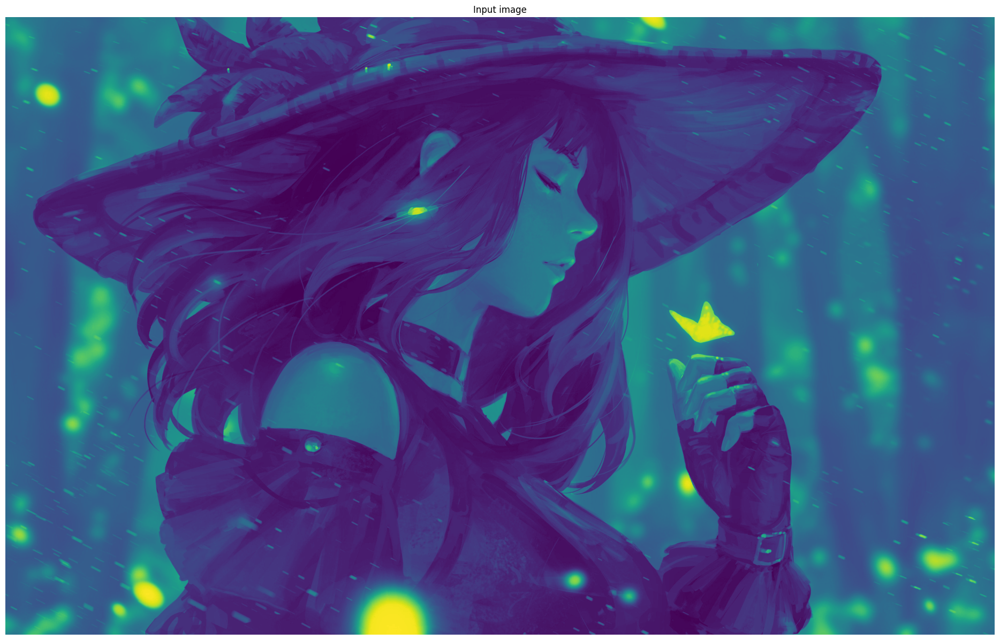

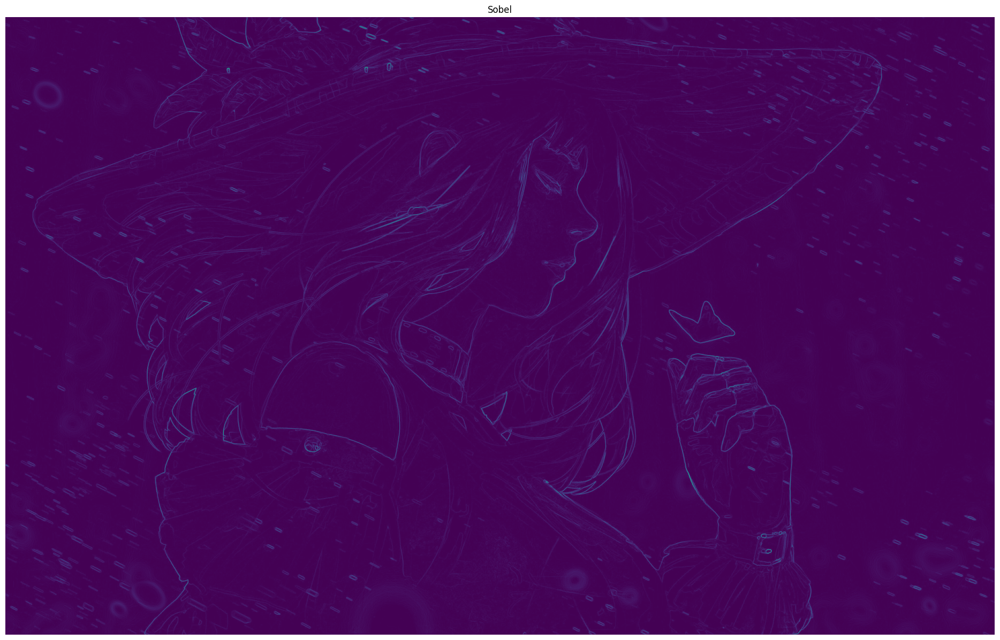

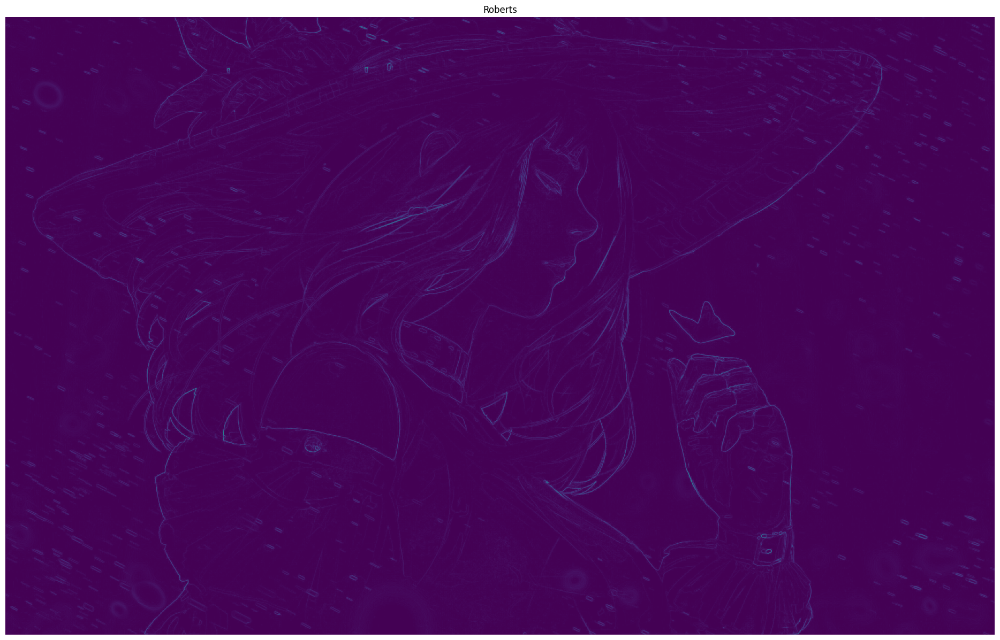

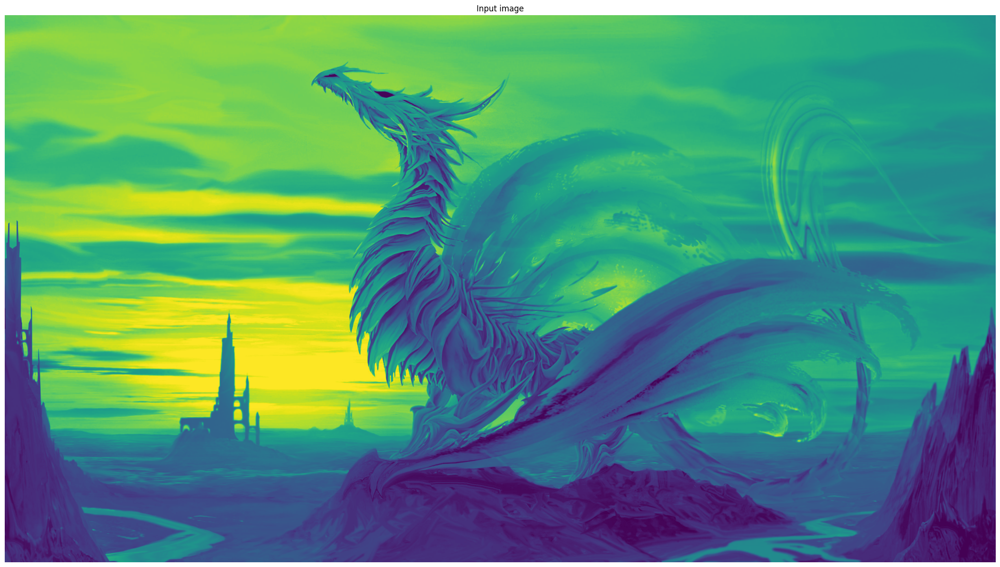

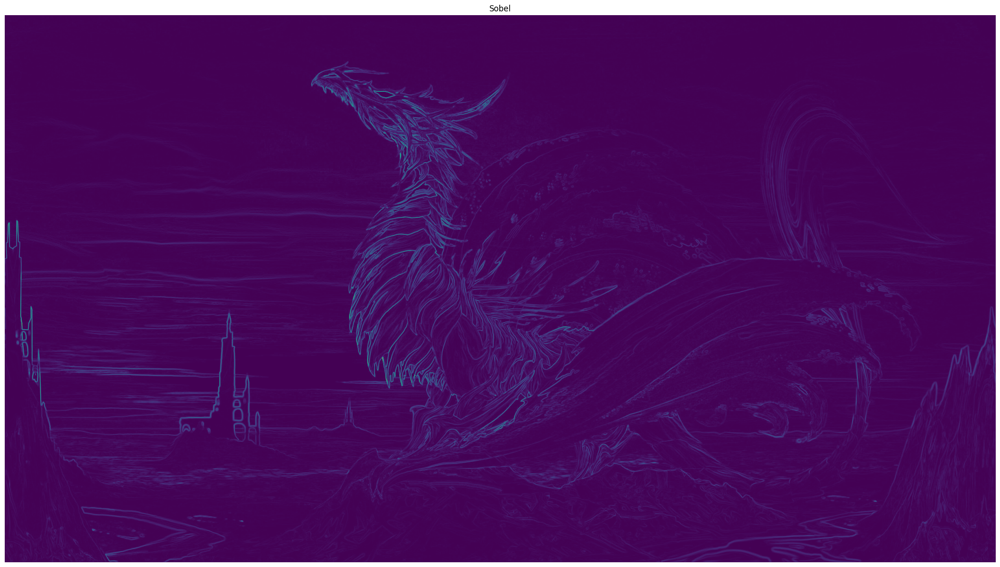

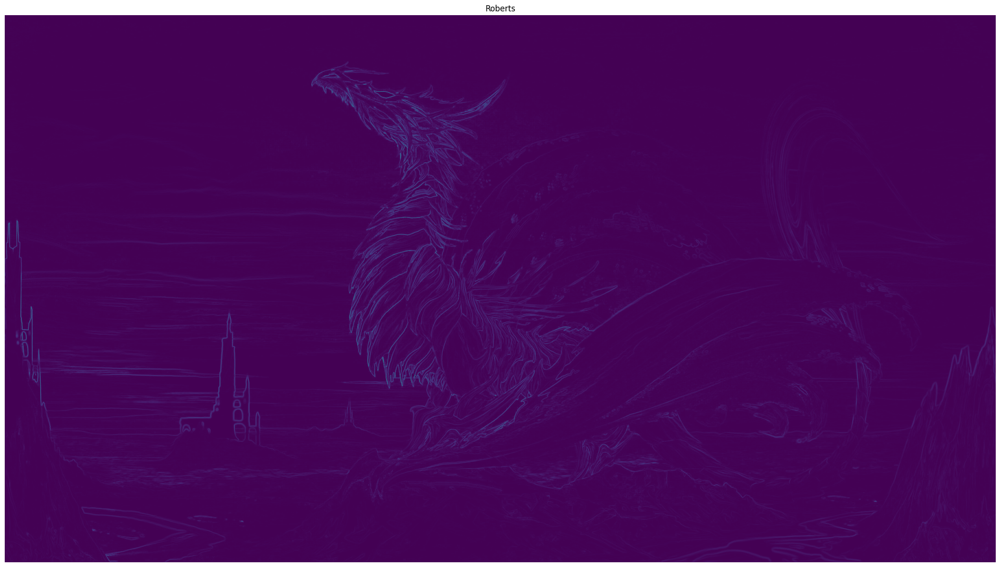

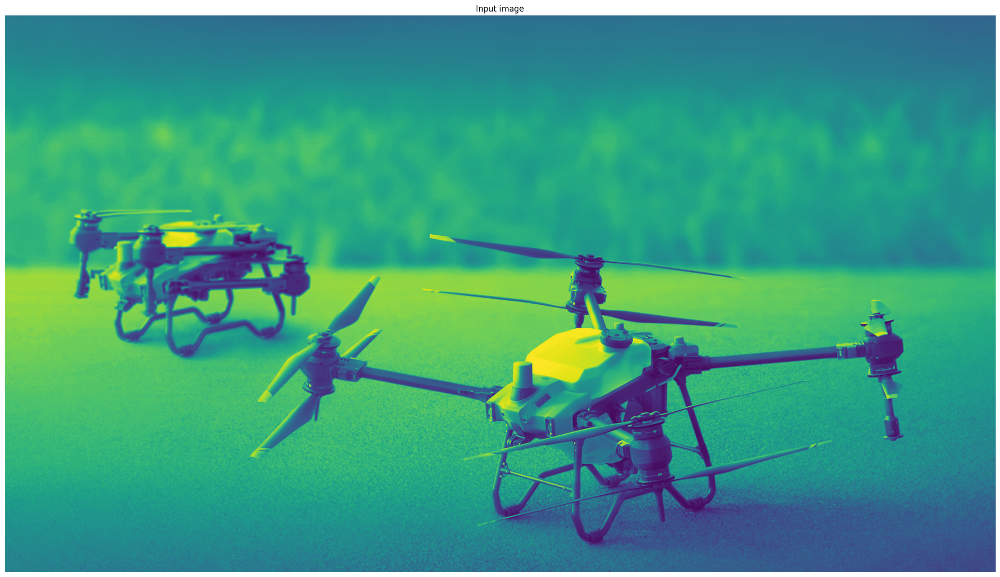

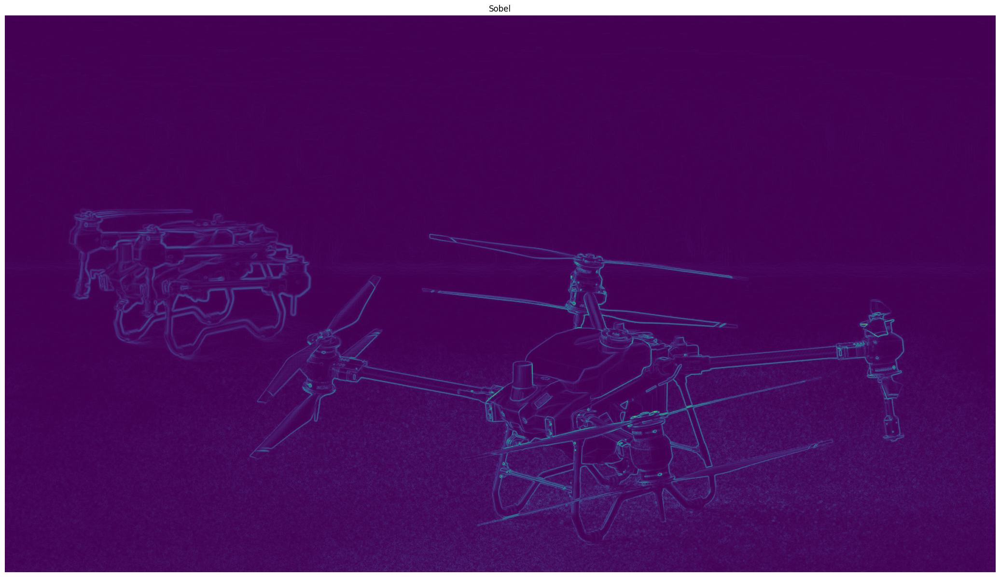

In [8]:

for img in images:
    sobel_filtered = border_detection(img, "Sobel")
    roberts_filtered = border_detection(img, "Roberts")

    show_img(img, 'Input image')
    show_img(sobel_filtered, 'Sobel')
    show_img(roberts_filtered, 'Roberts')